In [1]:
from typing import Union
import scanpy as sc
import anndata
import logging
import os
import numpy as np
import pandas as pd
import json
import sys
# import scanpy.external as sce
logging.basicConfig(level=logging.INFO)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import matplotlib.pyplot as plt
import seaborn as sns

# from PySpots.fish_helpers import *
from dredFISH.Analysis import basicu
from dredFISH.Analysis import regu
from dredFISH.Analysis import celltypeu
from dredFISH.Analysis import evalu
from dredFISH.Analysis import TissueGraph as tgh

import importlib
importlib.reload(tgh)
importlib.reload(celltypeu)
importlib.reload(evalu)
importlib.reload(basicu)
sc.set_figure_params(figsize=(7, 7))

In [2]:
logging.info('hi')

INFO:root:hi


# file paths and load data

In [3]:
prj_dir = '/bigstore/GeneralStorage/fangming/projects/dredfish/'
dat_dir = prj_dir + 'data/'
res_dir = prj_dir + 'data_dump/'
fig_dir = prj_dir + 'figures/'

output_csv = f'{res_dir}_celltypes_logreg_April4.csv'
print(output_csv)

# dredFISH data
dataset = 'DPNMF_PolyA_2021Nov19' # dataset tag
base_path = '/bigstore/Images2021/gaby/dredFISH/DPNMF_PolyA_2021Nov19/'
fish_path = f'{base_path}fishdata_2022Mar23/' # Zach's new version
# anndata_path = f'{base_path}results/raw_fishdata_Mar30.h5ad'
anndata_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/DPNMF_PolyA_2021Nov19_v2_results_anndata.h5ad'
# anndata_path = ''

# allen data
scrna_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/scrna_ss_ctxhippo_a_exon_DPNMF_matrix.h5ad'

# allen tree
allen_tree_path='/bigstore/GeneralStorage/fangming/reference/allen_ccf/structures.json'

/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/_celltypes_logreg_April4.csv


In [4]:
%%time
# load dredFISH
TMG = tgh.TissueMultiGraph(name=dataset)
# load raw counts data
if os.path.isfile(anndata_path):
    print('from AnnData')
    TMG.load_from_anndata(anndata_path)
else:
    print('from FishData')
    TMG.load_from_fishdata(fish_path, dataset, output_path=anndata_path)
# normalize (optional for spatial registration)
TMG.normalize_data(norm_cell=True, norm_bit=False)

### for now
data = TMG.data
# print(data)
    
# allen scrna matrix
ref_data = anndata.read_h5ad(scrna_path)
# print(ref_data)

# allen tree
allen_tree, allen_maps = regu.load_allen_tree(allen_tree_path)

from AnnData


INFO:root:113758 cells, minimum counts = 1248.0


CPU times: user 456 ms, sys: 153 ms, total: 609 ms
Wall time: 609 ms


In [5]:
# select specific regions
selected_regions = ['Isocortex', 'HPF']
selected_all_sids = regu.expand_regions(allen_tree, selected_regions, 'acronym')

# selected cells
cond_cells = data.obs['region_id'].isin(selected_all_sids)
data = data[cond_cells]
data

View of AnnData object with n_obs × n_vars = 44075 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'cell_name', 'stage_x', 'stage_y', 'coord_x', 'coord_y', 'region_id', 'region_color', 'region_acronym'
    obsm: 'stage'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors', 'norm_cell'

In [6]:
# prepare
ref_data.obs = ref_data.obs.rename(columns={
    'class_label': 'Level_1_class_label', 
    'neighborhood_label': 'Level_2_neighborhood_label', 
    'subclass_label': 'Level_3_subclass_label', 
    # 'supertype_label', 
    'cluster_label': 'Level_5_cluster_label', 
})

celltype_levels = np.sort(ref_data.obs.filter(regex=r'^Level_[0-9]', axis=1).columns.values)
print(celltype_levels)

levels = celltype_levels[:3]      
X_data = np.array(data.layers['norm_cell'])
X_refdata = np.array(ref_data.X)
Y_refdata = ref_data.obs[levels].values

print(levels, X_data.shape, X_refdata.shape, Y_refdata.shape)

['Level_1_class_label' 'Level_2_neighborhood_label'
 'Level_3_subclass_label' 'Level_5_cluster_label']
['Level_1_class_label' 'Level_2_neighborhood_label'
 'Level_3_subclass_label'] (44075, 24) (73347, 24) (73347, 3)


In [7]:
ref_data.obs.groupby('Level_1_class_label').size()

Level_1_class_label
GABAergic        22723
Glutamatergic    48796
Non-Neuronal      1828
dtype: int64

# run

In [8]:
# from sklearn.linear_model import LogisticRegression 
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.neighbors import KNeighborsClassifier
# # model = RandomForestClassifier()

# # model = LogisticRegression(penalty='none')
# # model = KNeighborsClassifier(n_neighbors=15, algorithm='ball_tree')

In [9]:
%%time
# run # baseline
importlib.reload(celltypeu)
output = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_baseline_fstatscale_April19.npy"
model = KNeighborsClassifier(n_neighbors=15, metric='cosine')
y_data = celltypeu.iterative_classify(
                 X_refdata,
                 Y_refdata,
                 X_data,
                 levels,
                 # run_func='run', # baseline
                 run_func='run', # baseline
                 run_kwargs_perlevel=[dict(norm='per_bit_fscale', n_cells=100)], 
                 model=model,
                 verbose=2, # extremely verbose
                 ignore_internal_failure=False,
)
print(output)
np.save(output, y_data)

INFO:root:iteration 1/3
INFO:root:Current round: level_0
INFO:root:F statistics (%): expected = 4.2
[ 3.25  4.31  5.48  2.79  4.19  2.00  0.26  0.40  0.89  3.84  4.02  1.73
  7.04 16.99  2.24  0.12  8.90  3.91  2.32  0.24  7.89  1.53  5.62 10.04]
INFO:root:iteration 2/3
INFO:root:Current round: level_1_cluster_GABAergic
INFO:root:F statistics (%): expected = 4.2
[ 6.86 22.17  4.41  9.78  7.91  5.07  0.25  0.89  1.16  0.57  0.60  0.69
  0.56 14.55  3.97  1.17  3.62  0.65  1.51  1.13  1.72  1.36  0.54  8.86]
INFO:root:Current round: level_1_cluster_Glutamatergic
INFO:root:F statistics (%): expected = 4.2
[ 7.26  1.50  1.26  6.78  5.88  2.93  0.90  9.58  3.67  2.44  1.10 10.96
  3.33  4.99  1.44  0.51  2.64  8.95  4.91  0.57  2.02  9.53  4.04  2.80]
INFO:root:Current round: level_1_cluster_Non-Neuronal
INFO:root:iteration 3/3
INFO:root:Current round: level_2_cluster_CGE
INFO:root:F statistics (%): expected = 4.2
[ 2.65  0.93  8.43  4.18  4.00  2.50  0.27  1.44  6.36  4.82  4.34  1.07
  1.

/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_baseline_fstatscale_April19.npy
CPU times: user 1min 6s, sys: 11.9 s, total: 1min 18s
Wall time: 7.91 s


In [10]:
# importlib.reload(celltypeu)

# # not quite good
# ctc = celltypeu.CellTypeClassify(
#     X_refdata,
#     Y_refdata[:,0],
#     X_data,
#     levels[0],
# )
# f_stats = ctc.normalizeData(norm='per_bit_fstat')


# f_stats, ctc.X_data.std(axis=0), ctc.X_refdata.std(axis=0)
# pd.Series(f_stats).sort_values()

In [11]:
# %%time

# # recipe
# # way off
# output = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_iterative_fstatscale_April11.npy"

# # run_kwargs_perlevel = []
# run_kwargs_perlevel = [
#     dict(overall_sample_fraction=0.1, # as large as possible, but should allow wiggle room to adjust sampled composition
#         min_total_cells=100,
#         min_cells=20, # should be > n_neighbors in kNN algorithm
#         p0 = 0.5,
#         norm='per_bit_toref',
#         subrun_func='run',
#         ),
    
#     dict(overall_sample_fraction=0.4, # as large as possible, but should allow wiggle room to adjust sampled composition
#         min_total_cells=100,
#         min_cells=20, # should be > n_neighbors in kNN algorithm
#         p0 = 0.5,
#         norm='per_bit_toref',
#         subrun_func='run',
#         ),
    
#     dict(overall_sample_fraction=0.8, # as large as possible, but should allow wiggle room to adjust sampled composition
#         min_total_cells=100,
#         min_cells=20, # should be > n_neighbors in kNN algorithm
#         p0 = 0.5,
#         norm='per_bit_toref',
#         subrun_func='run',
#         ),
# ]

# levels = celltype_levels[:3]

# y_data = celltypeu.iterative_classify(
#                  X_refdata,
#                  Y_refdata,
#                  X_data,
#                  levels,
#                  run_func='run_iterative_prior', # 
#                  # run_func='run', # 
#                  run_kwargs_perlevel=run_kwargs_perlevel,
#                  model=None,
#                  ignore_internal_failure=False,
#                  verbose=True,
# )


# print(output)
# np.save(output, y_data)

# Evaluate and save 

In [12]:
# f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_norm_sample_p53_April6.npy"
# f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_sample_norm_p52_April6.npy"
# f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_sample_norm_pp5_April6.npy"
# f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_baseline_April6.npy"
f = output
print(f)

y_data = np.load(f, allow_pickle=True)
res = data.obs.copy() #pd.DataFrame(index=data.obs.index)
for i, level in enumerate(levels):
    res[level] = y_data[:,i]
res

/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/celltypes_baseline_fstatscale_April19.npy


,label,pixel_x,pixel_y,nuclei_size,nuclei_signal,cytoplasm_size,cytoplasm_signal,total_size,total_signal,posname,...,stage_x,stage_y,coord_x,coord_y,region_id,region_color,region_acronym,Level_1_class_label,Level_2_neighborhood_label,Level_3_subclass_label
DPNMF_PolyA_2021Nov19_Pos3_cell_1.0,1.0,6.946154,13.064102,390.0,37376.0,94.0,26496.0,479.0,35312.0,Pos3,...,-2412.264446,-3414.258897,-3836.669362,257.071979,366,#15B0B3,TEa6a,Glutamatergic,NP/CT/L6b,L6b CTX
DPNMF_PolyA_2021Nov19_Pos3_cell_2.0,2.0,11.731343,96.792404,737.0,36368.0,146.0,26160.0,873.0,34224.0,Pos3,...,-2413.824418,-3441.554324,-3864.007917,257.349850,366,#15B0B3,TEa6a,Glutamatergic,NP/CT/L6b,L6b CTX
DPNMF_PolyA_2021Nov19_Pos3_cell_3.0,3.0,8.584210,230.557892,380.0,42064.0,132.0,34464.0,390.0,38992.0,Pos3,...,-2412.798453,-3485.161873,-3907.519336,254.279457,365,#15B0B3,TEa5,Glutamatergic,L4/5/6 IT Car3,Car3
DPNMF_PolyA_2021Nov19_Pos3_cell_5.0,5.0,7.058411,385.787384,428.0,46496.0,143.0,39760.0,566.0,45040.0,Pos3,...,-2412.301042,-3535.766687,-3958.045112,251.408807,365,#15B0B3,TEa5,Glutamatergic,NP/CT/L6b,NP PPP
DPNMF_PolyA_2021Nov19_Pos3_cell_7.0,7.0,9.555555,576.148865,477.0,6816.0,19.0,6400.0,475.0,6832.0,Pos3,...,-2413.115111,-3597.824530,-4020.072828,249.310951,365,#15B0B3,TEa5,Non-Neuronal,Other,SMC-Peri
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DPNMF_PolyA_2021Nov19_Pos102_cell_1351.0,1351.0,2025.603882,2292.653809,260.0,7744.0,220.0,8176.0,474.0,7888.0,Pos102,...,-409.346865,2777.594858,2442.321904,-1453.191293,463,#7ED04B,CA2,Non-Neuronal,Other,Endo
DPNMF_PolyA_2021Nov19_Pos102_cell_1352.0,1352.0,2031.969238,2012.783447,651.0,7664.0,114.0,7024.0,651.0,7248.0,Pos102,...,-411.421972,2868.832596,2533.361867,-1446.838662,463,#7ED04B,CA2,Non-Neuronal,Other,Micro-PVM
DPNMF_PolyA_2021Nov19_Pos102_cell_1353.0,1353.0,2031.924072,2435.701660,382.0,4432.0,126.0,4672.0,508.0,4560.0,Pos102,...,-411.407248,2730.961259,2395.642989,-1453.320683,463,#7ED04B,CA2,GABAergic,CGE,Sncg
DPNMF_PolyA_2021Nov19_Pos102_cell_1356.0,1356.0,2033.539062,2311.605469,256.0,8960.0,367.0,9360.0,629.0,9184.0,Pos102,...,-411.933734,2771.416617,2436.029118,-1450.897083,463,#7ED04B,CA2,Non-Neuronal,Other,Endo


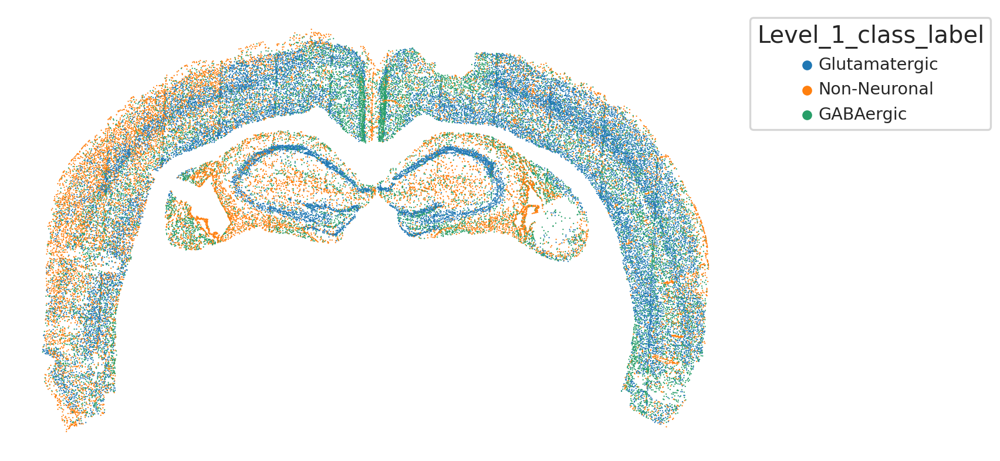

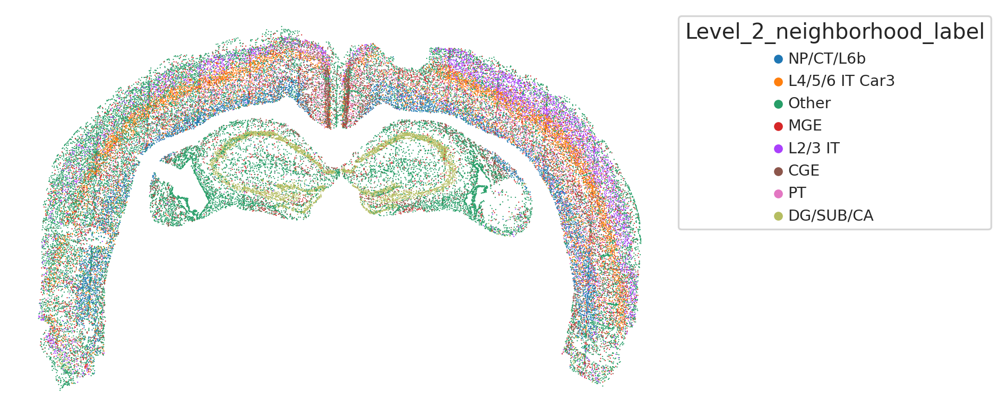

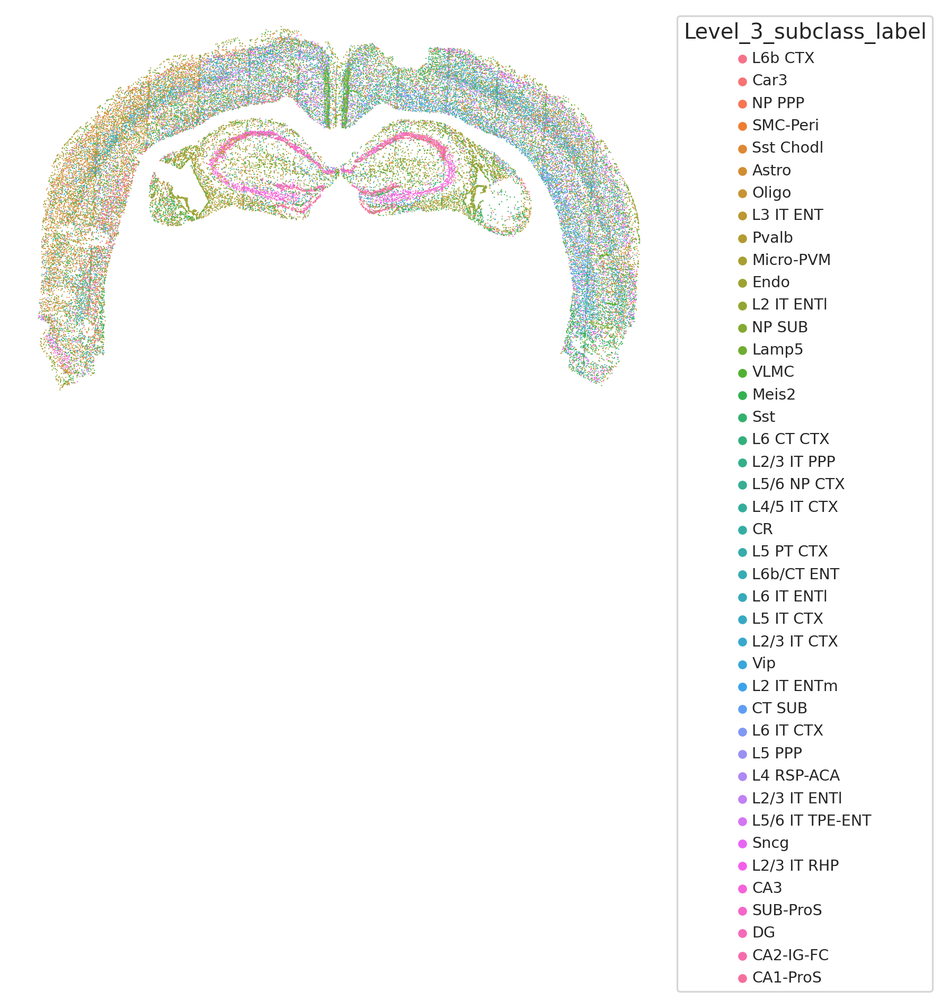

In [13]:
for level in levels:
    fig, ax = plt.subplots(figsize=(10,8))
    sns.scatterplot(data=res, x='coord_x', y='coord_y', hue=level,
                    # hue_order=np.sort(np.unique(res[level])),
                    s=1,
                    edgecolor='none',
                    rasterized=True,
                   )
    ax.axis('off')
    ax.legend(bbox_to_anchor=(1,1), 
              loc='upper left', 
              # ncol=1+int(len(np.unique(res[level]))/20), 
              title=level,
             )
    ax.invert_yaxis()
    ax.set_aspect('equal')
    plt.show()

In [14]:
# # input_celltypes = f'{res_dir}noHarmony_March30_v4_isocortex_hpf.csv'
# # print(input_celltypes)
input_embed1 = f'{res_dir}Joint_UMAP_isocortex_hpf_April1.csv'
print(input_embed1)
input_embed2 = f'{res_dir}Joint_UMAP_isocortex_hpf_subsamp100_level1_April1.csv'
print(input_embed2)

# analysis metadata
meta_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/analysis_meta_Mar31.json'


/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/Joint_UMAP_isocortex_hpf_April1.csv
/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/Joint_UMAP_isocortex_hpf_subsamp100_level1_April1.csv


In [15]:
# analysis
with open(meta_path, 'r') as fh:
    meta = json.load(fh)

In [16]:
# results
dftypes = res.copy() #pd.read_csv(input_celltypes, index_col=0)
dftypes = dftypes.filter(regex=r'^Level_[0-9]', axis=1)
levels = dftypes.columns.values

# update data
# data.obs = data.obs.join(dftypes)
for level in levels:
    if level in data.obs.columns.values:
        data.obs = data.obs.drop(level, axis=1)
data.obs = data.obs.join(dftypes)

# update the joint one
dfembed1 = pd.read_csv(input_embed1, index_col=0)
dfembed2 = pd.read_csv(input_embed2, index_col=0)
dfembed1 = dfembed1.join(pd.concat([data.obs, ref_data.obs]))
dfembed2 = dfembed2.join(pd.concat([data.obs, ref_data.obs]))

print(dftypes.shape, dfembed1.shape, dfembed2.shape, data.obs.shape)

(44075, 3) (117422, 79) (44375, 79) (44075, 23)


# Organize information

In [17]:

# importlib.reload(evalu)
resobj = evalu.Level3Res(meta, levels, 
                ref_data, data, 
                refdata_name='scRNA-seq', data_name='dredFISH',
                embed=True, df_embed=dfembed1,
               )

In [18]:
levels

array(['Level_1_class_label', 'Level_2_neighborhood_label',
       'Level_3_subclass_label'], dtype=object)

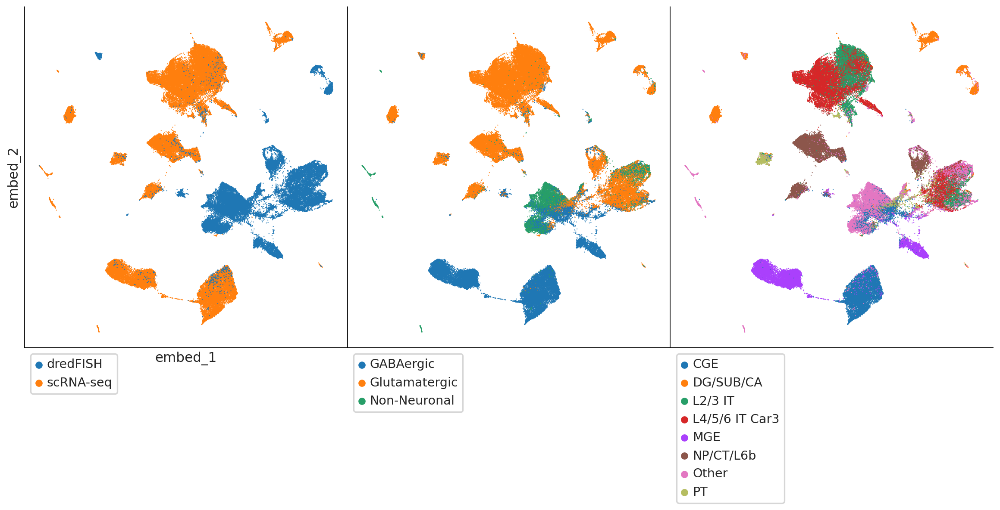

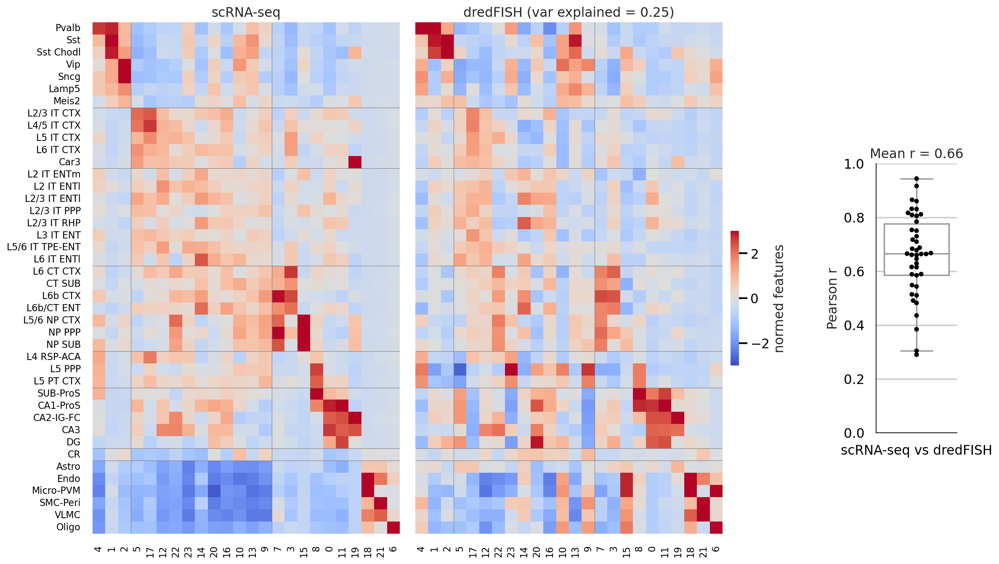

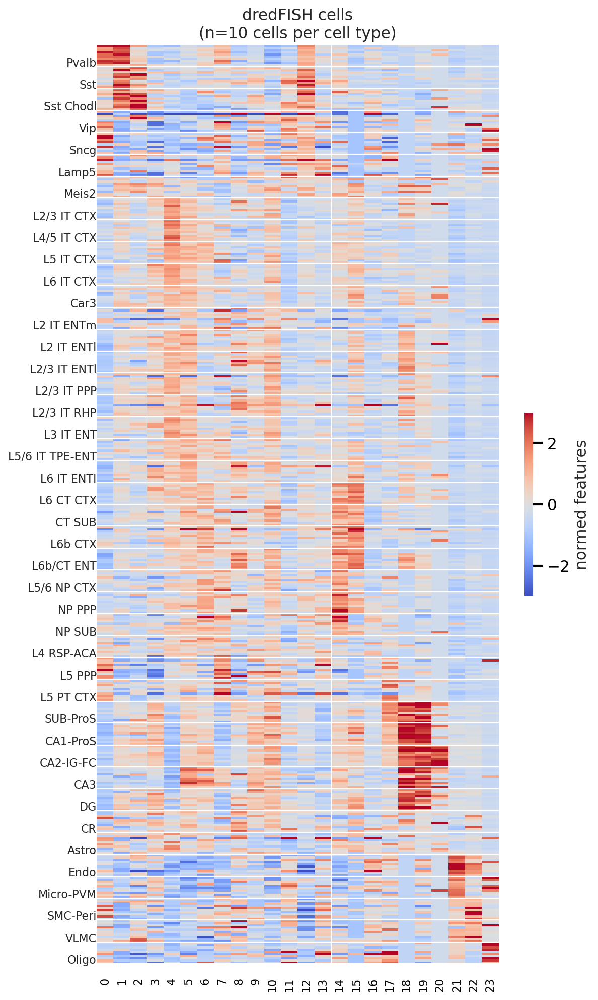

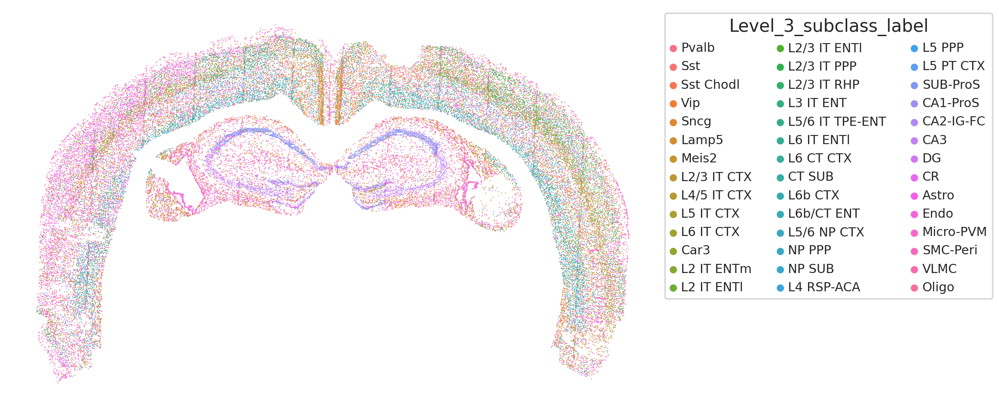

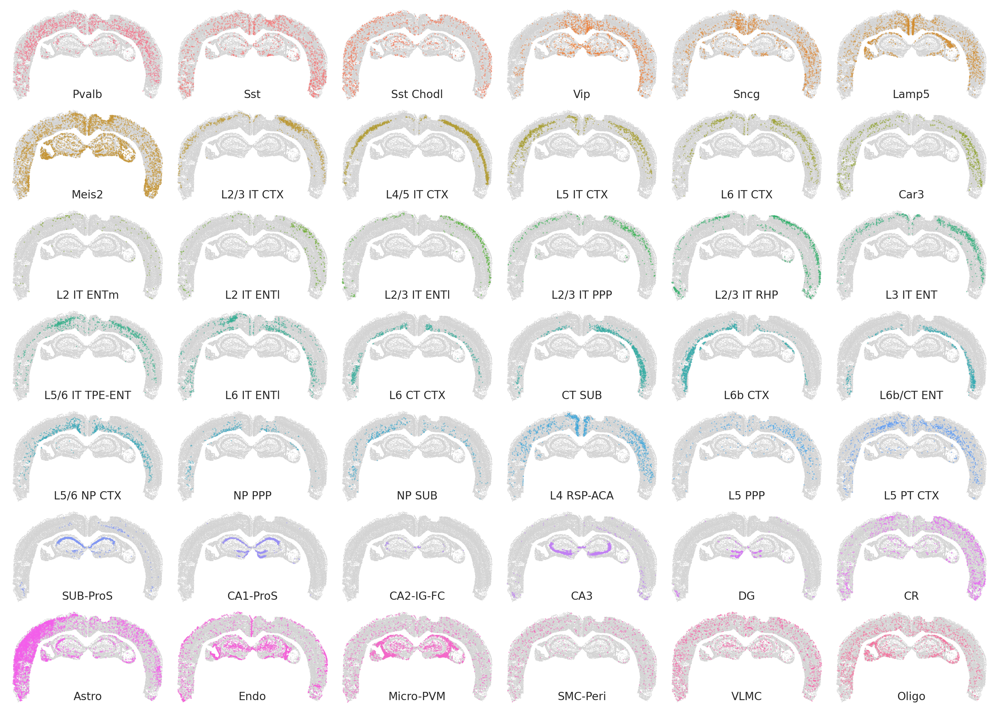

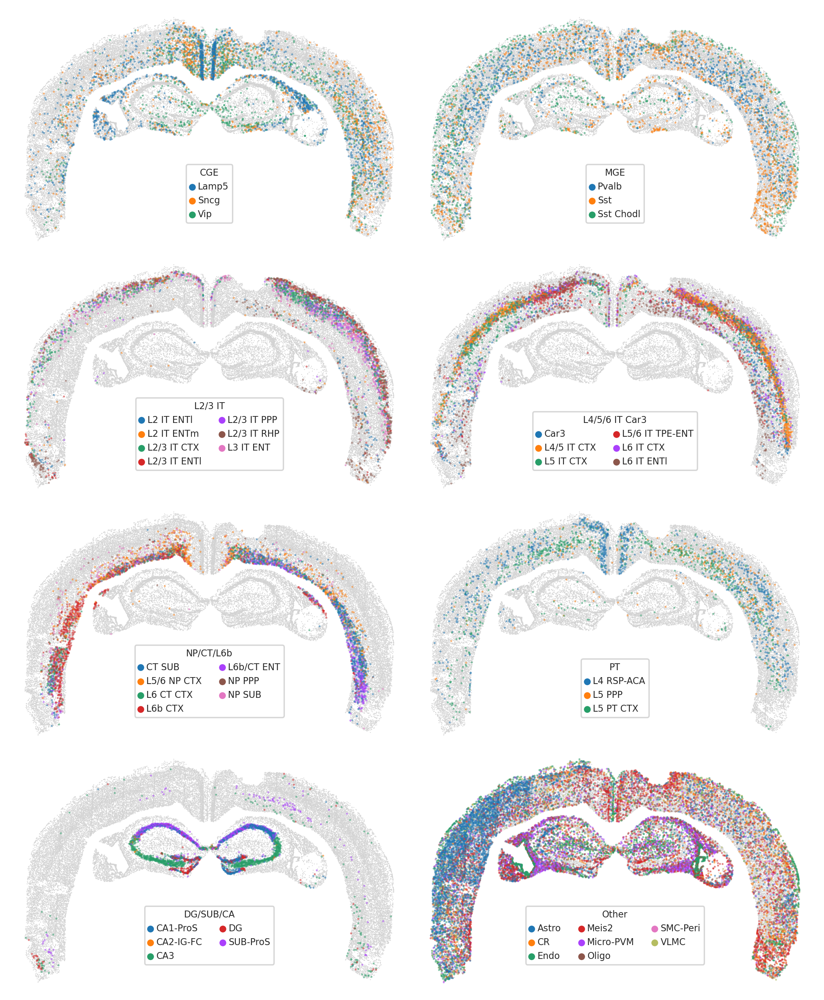

In [19]:

# embed eval
resobj.plot_embeds(hues=['dataset']+levels[:2].tolist())

# gene eval
resobj.plot_genes()

# spatial eval
resobj.plot_spatial()
